In [1]:
## This notebook can be run on Google Colab and it downloads the data from the GDrive folder and then can be used for further tasks.

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# Downloading the data from the gdrive folder
import gdown

file_id = "1KKPx9hp9wBTpjal0Ejg0s0L3Ysslym6Q"
output_file = "clean_data_file.zip"

gdown.download(f"https://drive.google.com/uc?id={file_id}", output_file)

# unzip the data file
!unzip clean_data_file.zip

Downloading...
From (original): https://drive.google.com/uc?id=1KKPx9hp9wBTpjal0Ejg0s0L3Ysslym6Q
From (redirected): https://drive.google.com/uc?id=1KKPx9hp9wBTpjal0Ejg0s0L3Ysslym6Q&confirm=t&uuid=b6d54211-1817-4308-807c-4da6d552dadb
To: /content/clean_data_file.zip
100%|██████████| 236M/236M [00:09<00:00, 23.7MB/s]


Archive:  clean_data_file.zip
  inflating: 100k_pos_tr_spec_R100.csv  


In [4]:
# Downloading the wavelength array
file_id = "1zBE7p6t_bhBnSuG-sx5lSyrUXlzvYAD-"
output_file = "wavelength.npy"
gdown.download(f"https://drive.google.com/uc?id={file_id}", output_file)
wvl = np.load(output_file)
wvl.shape

Downloading...
From: https://drive.google.com/uc?id=1zBE7p6t_bhBnSuG-sx5lSyrUXlzvYAD-
To: /content/wavelength.npy
100%|██████████| 2.28k/2.28k [00:00<00:00, 1.16MB/s]


(269,)

In [5]:
# Reading the Data from the csv file containing the spectra and the parameters
file_path = '/content/100k_pos_tr_spec_R100.csv'
data = np.genfromtxt(file_path, delimiter=',',skip_header=1)


In [6]:
data.shape # First 269 columns are the spectrum points and the remaining 11 are the input parameters

(98664, 280)

In [7]:
# List of the parameters
param_list = ['R_s', 'R_p', 'g_p', 'Temp', 'log_kappa_cloud', 'log_P_cloud','log_H2O','log_CO2','log_CO','log_CH4','log_NH3']


In [8]:
# Data shown in tabular format
df1 = pd.DataFrame(data[0:,:269])
df2 = pd.DataFrame(data[0:,269:], columns=param_list)
df3 = pd.concat([df1, df2], axis=1)
df3

,0,1,2,3,4,5,6,7,8,9,...,R_p,g_p,Temp,log_kappa_cloud,log_P_cloud,log_H2O,log_CO2,log_CO,log_CH4,log_NH3
0,0.004014,0.004014,0.004014,0.004014,0.004014,0.004014,0.004014,0.004014,0.004014,0.004014,...,1.658348,17.176982,3327.875478,-3.855474,-3.844470,-8.889865,-4.018888,-3.195541,-7.868857,-5.895533
1,0.000107,0.000107,0.000107,0.000107,0.000107,0.000107,0.000107,0.000107,0.000107,0.000107,...,0.258443,16.036432,2034.071133,-3.014919,-2.962217,-3.225697,-2.038615,-5.329029,-3.169883,-3.206833
2,0.000358,0.000358,0.000358,0.000358,0.000357,0.000357,0.000357,0.000357,0.000357,0.000357,...,0.503774,9.066010,1712.661454,-2.246068,-1.677456,-3.993484,-2.895214,-7.397882,-8.908273,-7.172669
3,0.012516,0.012516,0.012516,0.012516,0.012516,0.012516,0.012515,0.012515,0.012515,0.012515,...,0.562965,7.254639,3287.260930,-1.086659,-3.761693,-8.448541,-3.301345,-4.516020,-7.289866,-7.753208
4,0.001427,0.001427,0.001427,0.001427,0.001427,0.001427,0.001427,0.001427,0.001427,0.001427,...,0.745250,35.230361,2895.010899,-1.323324,-1.794849,-8.350682,-4.666140,-6.680365,-6.197769,-5.475105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98659,0.051244,0.051231,0.051218,0.051204,0.051189,0.051176,0.051165,0.051157,0.051161,0.051157,...,1.127280,23.840443,1888.494072,-0.852804,0.174308,-8.328901,-4.306115,-5.311498,-4.732160,-2.606973
98660,0.013549,0.013549,0.013549,0.013549,0.013549,0.013549,0.013549,0.013549,0.013549,0.013549,...,0.821014,39.964869,608.918946,-0.080777,-2.934876,-2.272423,-5.898074,-4.111940,-6.111954,-5.232814
98661,0.028945,0.028936,0.028931,0.028919,0.028914,0.028910,0.028905,0.028909,0.028904,0.028898,...,1.585554,21.984786,1662.144409,-5.621292,-0.207594,-2.164336,-5.986446,-4.369003,-3.304317,-8.281498
98662,0.004606,0.004605,0.004604,0.004602,0.004601,0.004600,0.004599,0.004598,0.004596,0.004595,...,1.523560,21.601466,2205.683764,-2.764175,0.358894,-3.131075,-5.491361,-3.416492,-4.298408,-5.343337


In [9]:
df3.describe()

,0,1,2,3,4,5,6,7,8,9,...,R_p,g_p,Temp,log_kappa_cloud,log_P_cloud,log_H2O,log_CO2,log_CO,log_CH4,log_NH3
count,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,...,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000,98664.000000
mean,0.010438,0.010436,0.010434,0.010432,0.010431,0.010429,0.010428,0.010426,0.010425,0.010424,...,1.060991,22.680367,1990.529089,-3.203587,-1.506352,-5.497066,-5.490777,-5.500600,-5.500026,-5.508865
std,0.018097,0.018095,0.018093,0.018090,0.018088,0.018086,0.018084,0.018082,0.018080,0.018079,...,0.542885,10.043365,866.480792,2.187283,1.445999,2.021719,2.020946,2.027659,2.023330,2.020505
min,0.000003,0.000003,0.000002,0.000002,0.000002,0.000002,0.000002,0.000002,0.000002,0.000002,...,0.100042,5.000412,500.059513,-6.999982,-3.999971,-8.999924,-8.999969,-8.999911,-8.999990,-8.999985
25%,0.001309,0.001309,0.001308,0.001308,0.001307,0.001307,0.001306,0.001305,0.001305,0.001305,...,0.593661,14.036827,1238.898762,-5.087822,-2.762471,-7.250021,-7.239419,-7.264763,-7.260083,-7.261356
50%,0.004088,0.004087,0.004086,0.004085,0.004084,0.004084,0.004083,0.004083,0.004082,0.004081,...,1.061147,22.724996,1986.033911,-3.215291,-1.504305,-5.488896,-5.485339,-5.499874,-5.502937,-5.508495
75%,0.010495,0.010493,0.010488,0.010486,0.010485,0.010483,0.010480,0.010479,0.010479,0.010477,...,1.531775,31.344526,2737.571477,-1.317402,-0.255494,-3.753459,-3.741738,-3.740803,-3.745523,-3.763974
max,0.180863,0.180862,0.180862,0.180862,0.180861,0.180861,0.180861,0.180861,0.180860,0.180860,...,1.999990,39.999593,3499.933503,0.599861,0.999957,-2.000011,-2.000260,-2.000041,-2.000107,-2.000021


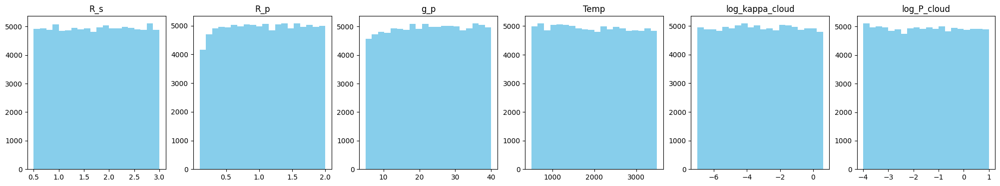

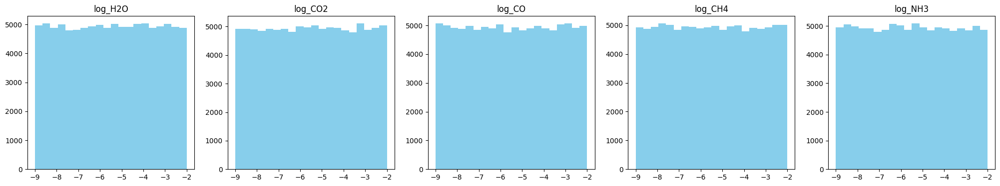

In [15]:
param_keys = ['R_s', 'R_p', 'g_p', 'Temp', 'log_kappa_cloud', 'log_P_cloud', 'log_H2O', 'log_CO2', 'log_CO', 'log_CH4', 'log_NH3']
# plot the frequency vs value histograms of the random parameters
fig, axs = plt.subplots(1, 6, figsize=(25, 4))
for i in range(6):
        axs[i].hist(df3[param_keys[i]], bins=20, color='skyblue')
        axs[i].set_title(param_keys[i])
plt.show()
# plot the frequency vs value histograms of the random mixing parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))
for i in range(6,11):
        axs[i-6].hist(df3[param_keys[i]], bins=20, color='skyblue')
        axs[i-6].set_title(param_keys[i])
plt.show()

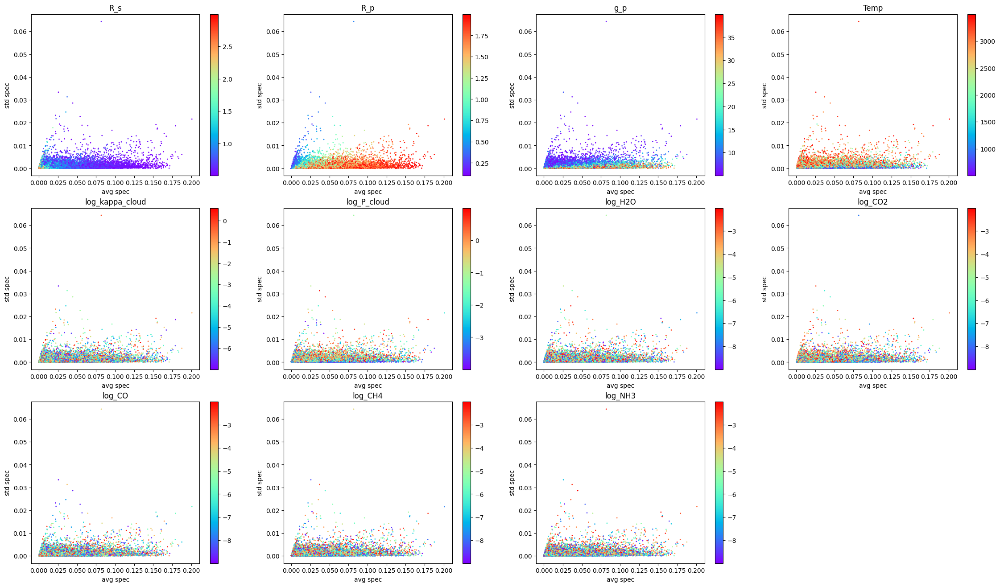

In [16]:
train_data = df3.to_numpy()
train_data.shape

avg_M = np.average(train_data[:,0:269],axis=1)

std_M = np.std(train_data[:,0:269],axis=1)
avg_M.shape, std_M.shape

fig = plt.figure(figsize=(28,16))
t = ['R_s', 'R_p', 'g_p', 'Temp', 'log_kappa_cloud', 'log_P_cloud', 'log_H2O', 'log_CO2', 'log_CO', 'log_CH4', 'log_NH3']
for i in range(11):
    plt.subplot(3,4,1+i)
    plt.scatter(avg_M,std_M,c=train_data[:,269+i],cmap='rainbow',s=1)
    plt.colorbar()
    plt.xlabel('avg spec')
    plt.ylabel('std spec')
    plt.title(t[i])

plt.show()

### Normalizing each spectra

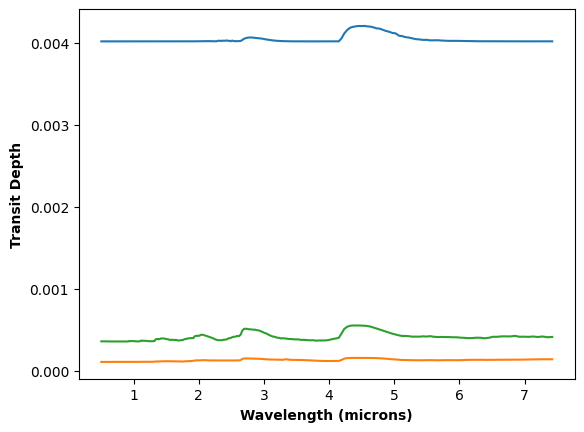

In [20]:
plt.plot(wvl, train_data[0,:269])
plt.plot(wvl, train_data[1,:269])
plt.plot(wvl, train_data[2,:269])
plt.ylabel('Transit Depth',fontweight='bold',fontsize=10)
plt.xlabel('Wavelength (microns)',fontweight='bold',fontsize=10)
plt.show()

If we plot 2-3 models we can not see the features like the transit spectras.This is due to planetary parameters such as variable star radius, planet radius and gravity. We need to normalize the spectras.

In [21]:
new_spec = np.zeros_like(train_data[:,:269])
for i in range(len(train_data)):
    mean_sp = np.mean(train_data[i,:269])
    std_sp = np.std(train_data[i,:269])
    new_spec[i,:269] = (train_data[i,:269] - mean_sp) / std_sp

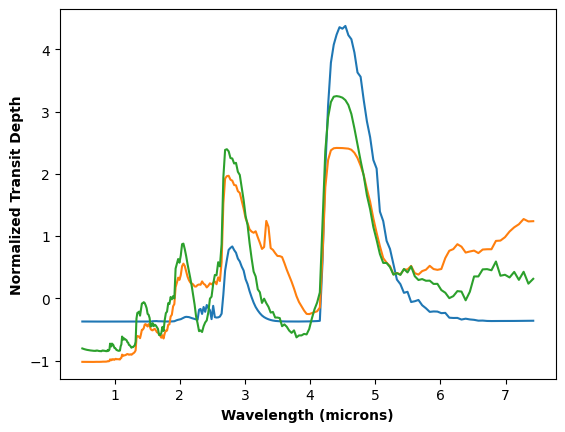

In [23]:
plt.plot(wvl, new_spec[0,:269])
plt.plot(wvl, new_spec[1,:269])
plt.plot(wvl, new_spec[2,:269])
plt.ylabel('Normalized Transit Depth',fontweight='bold',fontsize=10)
plt.xlabel('Wavelength (microns)',fontweight='bold',fontsize=10)
plt.show()

In [ ]:
plt.plot(wvl, train_data[0,:269])
plt.plot(wvl, train_data[1,:269])
plt.plot(wvl, train_data[2,:269])
plt.ylabel('Transit Depth',fontweight='bold',fontsize=10)
plt.xlabel('Wavelength (microns)',fontweight='bold',fontsize=10)
plt.show()

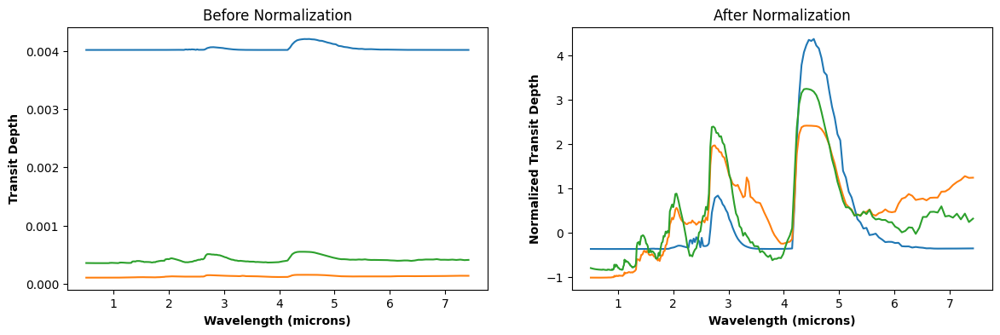

In [27]:
fig, axs = plt.subplots(1, 2, figsize=(14, 4))

axs[0].plot(wvl, train_data[0,:269])
axs[0].plot(wvl, train_data[1,:269])
axs[0].plot(wvl, train_data[2,:269])
axs[0].set_ylabel('Transit Depth',fontweight='bold',fontsize=10)
axs[0].set_xlabel('Wavelength (microns)',fontweight='bold',fontsize=10)
axs[0].set_title('Before Normalization')

axs[1].plot(wvl, new_spec[0,:269])
axs[1].plot(wvl, new_spec[1,:269])
axs[1].plot(wvl, new_spec[2,:269])
axs[1].set_ylabel('Normalized Transit Depth',fontweight='bold',fontsize=10)
axs[1].set_xlabel('Wavelength (microns)',fontweight='bold',fontsize=10)
axs[1].set_title('After Normalization')

plt.show()

Now we can clearly see the features like transit spectras after normalization. Now the spectras different spectras can be analysed by the atmospheric parameters such as temp and gases in the atmospheres.

In [ ]:
## The mean of each normalized spectras is zero and standard deviation is 1.
avg_M = np.average(new_spec[:,0:269],axis=1)

std_M = np.std(new_spec[:,0:269],axis=1)
avg_M, std_M

(array([ 1.56308258e-14, -5.72033127e-16, -1.69216149e-16, ...,
         6.08435235e-15,  1.44287721e-15,  1.73957296e-15]),
 array([1., 1., 1., ..., 1., 1., 1.]))

Trying PCA on the normalised spectras.

In [ ]:
from sklearn.decomposition import PCA

N = len(train_data)
#running PCA
pca = PCA(n_components=20)
pca.fit(new_spec[:N,:269])
PCA_out = pca.fit_transform(new_spec[:N,:269])
PCA_out.shape

(98664, 20)

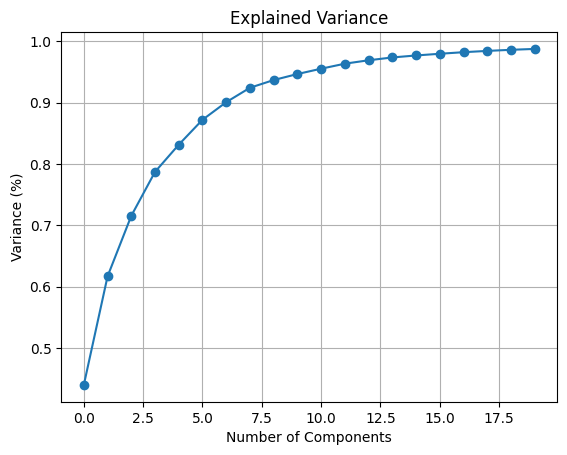

In [ ]:
# plot the cumulative explained variance
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_),marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)') #for each component
plt.title('Explained Variance')
plt.grid()
plt.show()

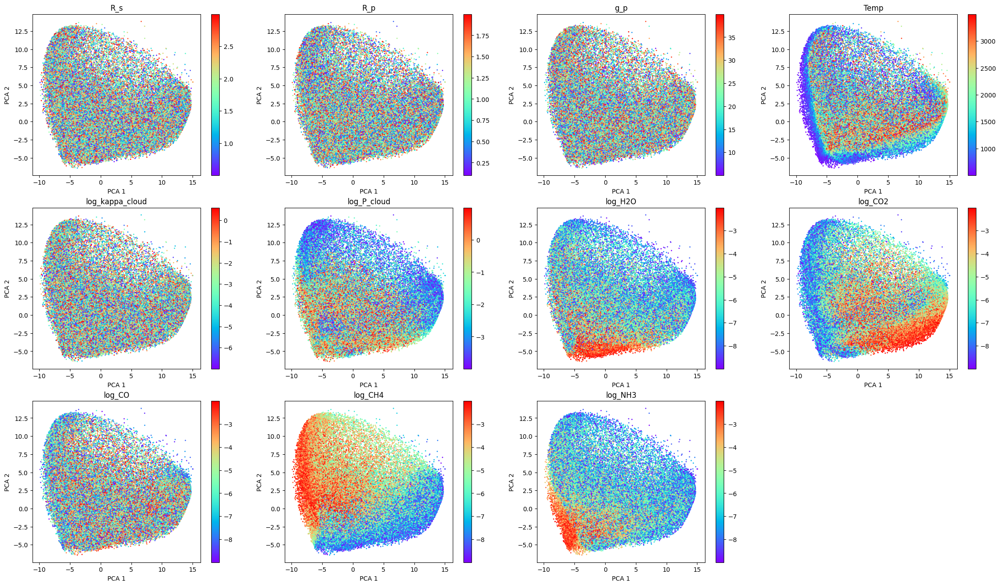

In [ ]:
fig = plt.figure(figsize=(28,16))
t = ['R_s', 'R_p', 'g_p', 'Temp', 'log_kappa_cloud', 'log_P_cloud', 'log_H2O', 'log_CO2', 'log_CO', 'log_CH4', 'log_NH3']
for i in range(11):
    plt.subplot(3,4,1+i)
    plt.scatter(PCA_out[:,0],PCA_out[:,1],c=train_data[:N,269+i],cmap='rainbow',s=1)
    plt.colorbar()
    plt.xlabel('PCA 1')
    plt.ylabel('PCA 2')
    plt.title(t[i])

plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


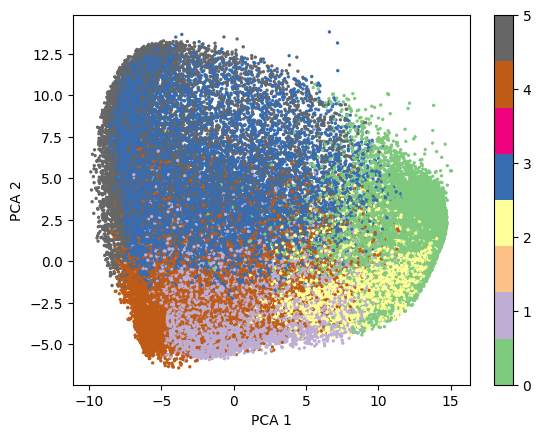

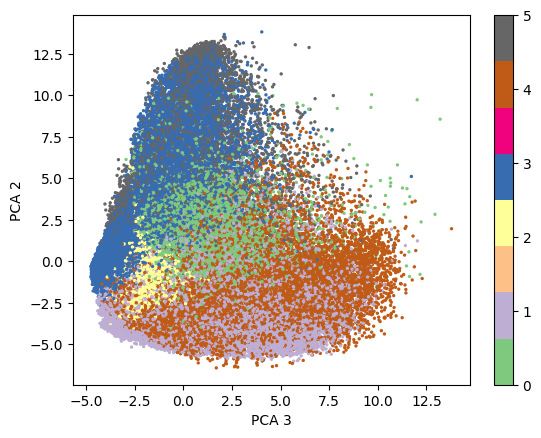

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Separate features and target
X = new_spec[:,:269] # Features


# Perform PCA
pca = PCA(n_components=20)
PCA_out = pca.fit_transform(X)

scaler = StandardScaler()
PCA_scaled = scaler.fit_transform(PCA_out)

# Perform K-means clustering
kmeans = KMeans(n_clusters=6)
kmeans.fit(PCA_scaled)
cluster_labels = kmeans.labels_

plt.figure()
plt.scatter(PCA_out[:,0],PCA_out[:,1],c=cluster_labels,cmap='Accent',s=2)
plt.colorbar()
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')

plt.figure()
# plt.scatter(PCA_out[:,0],PCA_out[:,2])
plt.scatter(PCA_out[:,2],PCA_out[:,1],c=cluster_labels,cmap='Accent',s=2)
plt.colorbar()
plt.xlabel('PCA 3')
plt.ylabel('PCA 2')

plt.show()

In [ ]:
np.unique(cluster_labels, return_counts=True)

(array([0, 1, 2, 3, 4, 5], dtype=int32),
 array([10948, 21514,  8398, 20863, 29720,  7221]))

In [ ]:
cl_par_df = df3.iloc[:,273:]
cl_par_df['cluster'] = cluster_labels
cl_par_df

,log_kappa_cloud,log_P_cloud,log_H2O,log_CO2,log_CO,log_CH4,log_NH3,cluster
0,-3.855474,-3.844470,-8.889865,-4.018888,-3.195541,-7.868857,-5.895533,0
1,-3.014919,-2.962217,-3.225697,-2.038615,-5.329029,-3.169883,-3.206833,3
2,-2.246068,-1.677456,-3.993484,-2.895214,-7.397882,-8.908273,-7.172669,1
3,-1.086659,-3.761693,-8.448541,-3.301345,-4.516020,-7.289866,-7.753208,2
4,-1.323324,-1.794849,-8.350682,-4.666140,-6.680365,-6.197769,-5.475105,2
...,...,...,...,...,...,...,...,...
98659,-0.852804,0.174308,-8.328901,-4.306115,-5.311498,-4.732160,-2.606973,4
98660,-0.080777,-2.934876,-2.272423,-5.898074,-4.111940,-6.111954,-5.232814,1
98661,-5.621292,-0.207594,-2.164336,-5.986446,-4.369003,-3.304317,-8.281498,1
98662,-2.764175,0.358894,-3.131075,-5.491361,-3.416492,-4.298408,-5.343337,1


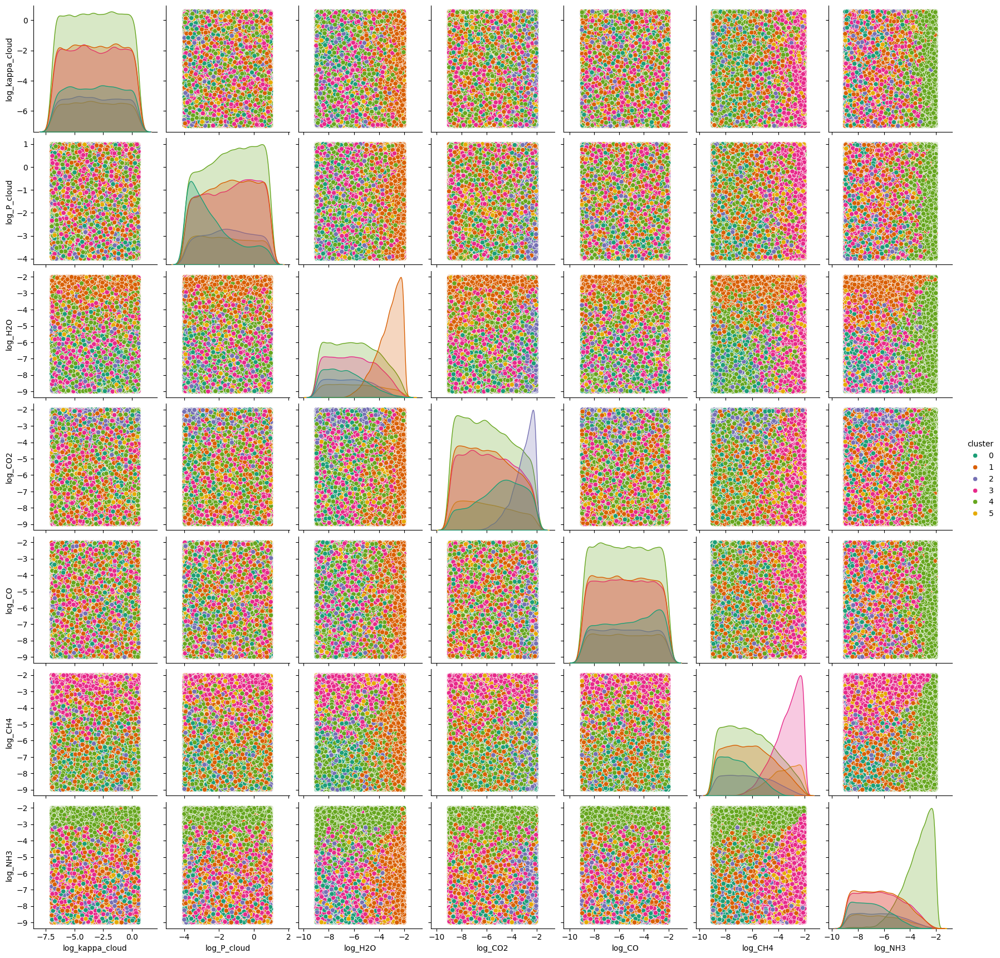

In [ ]:
# pair plot for the clusters
import seaborn as sns
sns.pairplot(cl_par_df, hue='cluster', palette='Dark2', diag_kind='kde')

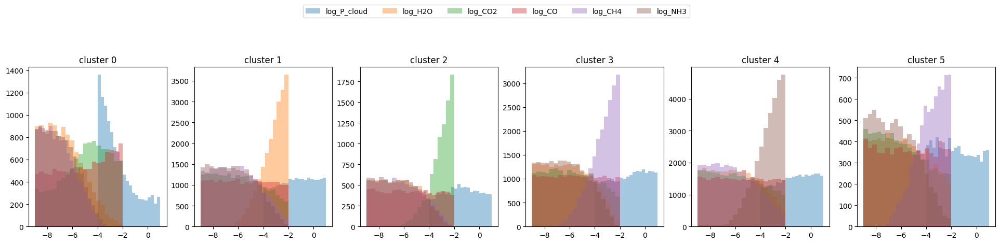

In [ ]:

cl_key = ['log_P_cloud', 'log_H2O', 'log_CO2', 'log_CO', 'log_CH4', 'log_NH3']

fig, axs = plt.subplots(1, 6, figsize=(24, 4))
for i in range(6):
    for j in range(6):
      if i == 0:
        axs[i].hist(cl_par_df[cl_par_df['cluster'] == i][cl_key[j]], bins=20,alpha=0.4,label=cl_key[j])
      else:
        axs[i].hist(cl_par_df[cl_par_df['cluster'] == i][cl_key[j]], bins=20,alpha=0.4)
      axs[i].set_title('cluster '+str(i))

fig.legend(loc='lower center', bbox_to_anchor=(0.5, 1.1), ncol=6)
plt.show()